# Process all Cascade Volcanoes

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import rasterio as rio
import pystac
import pystac_client
import stackstac
import matplotlib.pyplot as plt
import xarray as xr
from datetime import datetime
import matplotlib
import ipyleaflet
import sys
import os
import dask_gateway
import planetary_computer
from rechunker import rechunk
sys.path.append('../sar_snowmelt_timing')
import s1_rtc_bs_utils
import contextily as ctx
import rioxarray as rxr
import skimage
import pathlib
import glob
import re

In [2]:
cluster = dask_gateway.GatewayCluster()
client = cluster.get_client()
cluster.adapt(minimum=20, maximum=100)
print(client.dashboard_link)

https://pccompute.westeurope.cloudapp.azure.com/compute/services/dask-gateway/clusters/prod.84872c983c4c4e05a83a89102c53da0f/status


In [3]:
names = ['MtBaker',
         'GlacierPeak',
         'MtRainier',
         'MtAdams',
         'MtStHelens',
         'MtHood',
         'MtJefferson',
         'ThreeSisters',
         #'CraterLake',
         'MtShasta',
         'LassenPeak',]

geojsons = ['../input/shapefiles/mt_baker.geojson',
            '../input/shapefiles/glacier_peak.geojson',
            '../input/shapefiles/mt_rainier.geojson',
            '../input/shapefiles/mt_adams.geojson',
            '../input/shapefiles/mt_st_helens.geojson',
            '../input/shapefiles/mt_hood.geojson',
            '../input/shapefiles/mt_jefferson.geojson',
            '../input/shapefiles/three_sisters.geojson',
            #'../input/shapefiles/crater_lake.geojson',
            '../input/shapefiles/mt_shasta.geojson',
            '../input/shapefiles/lassen_peak.geojson',]

In [4]:
years = [2015,2016,2017,2018,2019,2020,2021,2022]

In [5]:
classes = [ # page 13 of https://esa-worldcover.s3.amazonaws.com/v100/2020/docs/WorldCover_PUM_V1.0.pdf
#    10, # treecover
    20, # shrubland
    30, # grassland
    40, # cropland
#    50, # built-up
    60, #bare / sparse vegetation
    70, # snow and ice
#    80, # permanent water bodies
    90, # herbaceous wetlands
    95, # mangroves
    100 # loss and lichen
]

In [9]:
for nm, gj in zip(names,geojsons):
    print(f'Processing {nm}:')
    bbox_gdf = gpd.read_file(gj)
    ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac_pc(bbox_gdf,start_time='2014-01-01',end_time='2022-12-31',polarization='all',resolution=10)
    worldcover = s1_rtc_bs_utils.get_worldcover(ts_ds)
    ts_ds = ts_ds.where(worldcover.isin(classes))
    
    path = f'../output/cascades/{nm}' 
    savedir = pathlib.Path(path)
    savedir.mkdir(parents=True,exist_ok=True)
    
    for year in years:
        print(f'Processing {year}...')
        melt_year = slice(f'{year}-02-01',f'{year}-09-30')
        ts_ds_oneyear = ts_ds.sel(time=melt_year) 
        runoffs_median = s1_rtc_bs_utils.get_runoff_onset(ts_ds_oneyear,num_acquisitions_during_melt_season=6)
        runoffs_median_computed = runoffs_median.compute()
        runoffs_median_computed.dt.dayofyear.rio.to_raster(f'../output/cascades/{nm}/runoff_onset_{nm}_{year}_median_vvvh_10m.tif')
print(f'Done!')

Processing MtBaker:
Processing 2015...
Processing 2016...
Processing 2017...
Processing 2018...
Processing 2019...
Processing 2020...
Processing 2021...
Processing 2022...
Processing GlacierPeak:
Processing 2015...
Processing 2016...
Processing 2017...
Processing 2018...
Processing 2019...
Processing 2020...
Processing 2021...
Processing 2022...
Processing MtRainier:
Processing 2015...
Processing 2016...
Processing 2017...
Processing 2018...
Processing 2019...
Processing 2020...
Processing 2021...
Processing 2022...
Processing MtAdams:
Processing 2015...
Processing 2016...
Processing 2017...
Processing 2018...
Processing 2019...
Processing 2020...
Processing 2021...
Processing 2022...
Processing MtStHelens:
Processing 2015...
Processing 2016...
Processing 2017...
Processing 2018...
Processing 2019...
Processing 2020...
Processing 2021...
Processing 2022...
Processing MtHood:
Processing 2015...
Processing 2016...
Processing 2017...
Processing 2018...
Processing 2019...
Processing 2020..

# Now loop through all folders, create an all year median

Processing MtBaker:
Processing GlacierPeak:
Processing MtRainier:
Processing MtAdams:
Processing MtStHelens:
Processing MtHood:
Processing MtJefferson:
Processing ThreeSisters:
Processing MtShasta:
Processing LassenPeak:


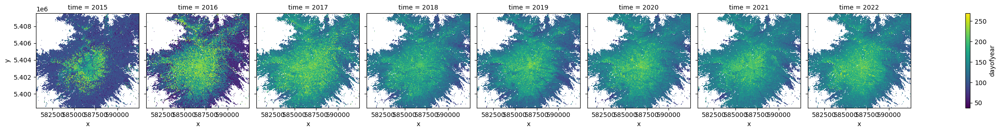

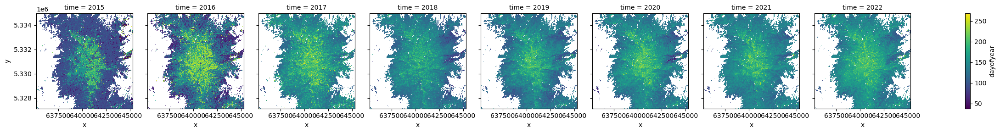

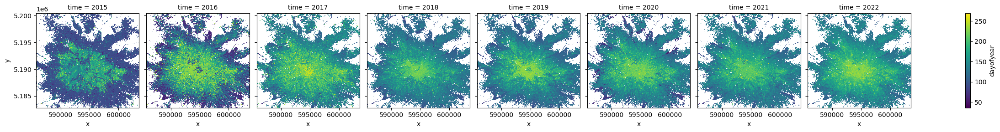

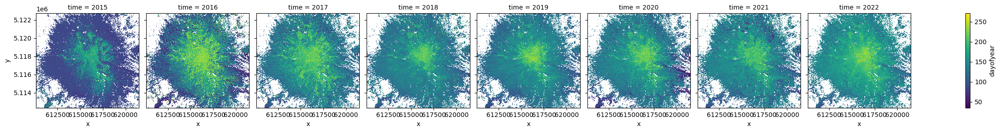

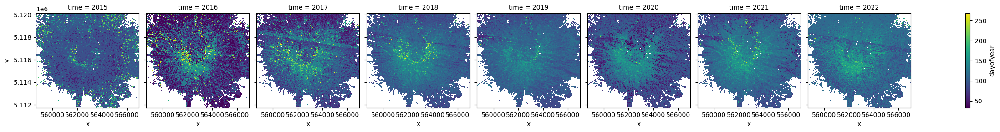

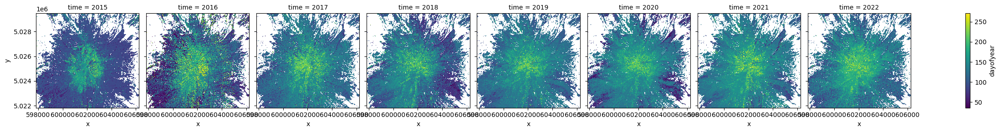

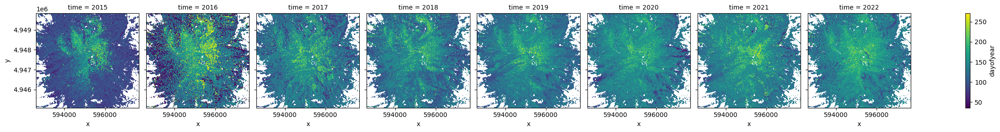

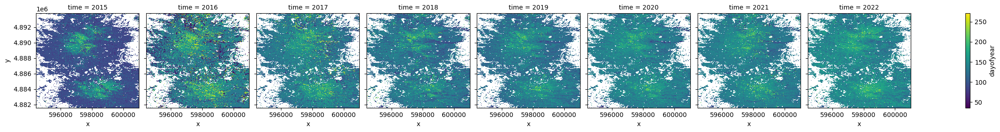

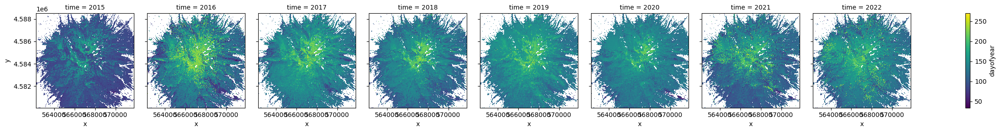

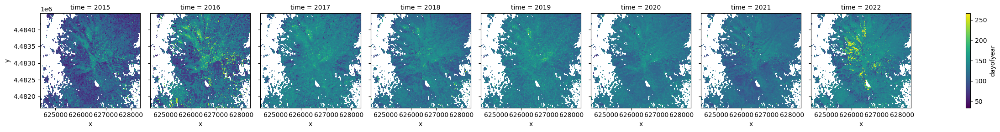

In [10]:
for nm in names:
    print(f'Processing {nm}:')
    geotiff_list = glob.glob(f'../output/cascades/{nm}/runoff_onset_*_2*.tif')
    
    year_list = []
    for geotiff in geotiff_list:
        year_list.append(re.search("([0-9]{4})", geotiff).group(0))
    year_list = [int(year) for year in year_list]

 #Create variable used for time axis
    time_var = xr.Variable('time', year_list)

# Load in and concatenate all individual GeoTIFFs
    runoffs_allyears = xr.concat([rxr.open_rasterio(i) for i in geotiff_list],dim=time_var).squeeze().sortby('time')
    
    runoffs_allyears.plot(col='time')
    runoffs_allyears.median(dim='time').rio.to_raster(f'../output/cascades/{nm}/runoff_onset_{nm}_allyears_median_vvvh_10m.tif')
    runoffs_allyears.std(dim='time').rio.to_raster(f'../output/cascades/{nm}/runoff_onset_{nm}_allyears_std_vvvh_10m.tif')
    polyfits= runoffs_allyears.polyfit('time',deg=1)
    polyfits.polyfit_coefficients[0].rio.set_crs(runoffs_allyears.rio.crs).rio.to_raster(f'../output/cascades/{nm}/runoff_onset_{nm}_allyears_polyfit_vvvh_10m.tif')